# Importing libraries and data

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import datetime
import math
import re
import requests
from fuzzywuzzy import fuzz
from fuzzywuzzy import process
import time

In [2]:
# ✅ to remove, just for testing models
import math
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn import preprocessing
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from xgboost.sklearn import XGBRegressor

warnings.filterwarnings('ignore')

In [3]:
pd.set_option('display.max_colwidth', 1000)

In [6]:
df = pd.read_csv(r"data\books.csv", on_bad_lines='warn')

# Utilities

In [20]:
def find_book(title: str) -> df:
    result = df[df["title"].str.contains(title,regex=True,case=False)==True]
    return result

# Data cleaning

## Duplicates

We consider duplicates based on their `isbn`, `isbn13` or `title`

In [11]:
df.isbn.duplicated().sum()

0

In [12]:
df.isbn13.duplicated().sum()

0

In [13]:
df.title.duplicated().sum()

775

In [27]:
df['num_occ'] = df.groupby('title')['title'].transform('count')
df.loc[df['num_occ'] > 4]

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,num_occ
89,151,Anna Karenina,Leo Tolstoy/Richard Pevear/Larissa Volokhonsky,4.05,0143035002,9780143035008,eng,838,16643,1851,5/31/2004,Penguin Classics,8
90,152,Anna Karenina,Leo Tolstoy/David Magarshack/Priscilla Meyer,4.05,0451528611,9780451528612,eng,960,109420,5696,11/5/2002,Signet,8
91,153,Anna Karenina,Leo Tolstoy/Richard Pevear/Larissa Volokhonsky/John Bayley,4.05,0140449175,9780140449174,eng,837,2904,309,1/30/2003,Penguin Books,8
93,155,Anna Karenina,Leo Tolstoy/Amy Mandelker/Constance Garnett,4.05,1593080271,9781593080273,eng,803,9564,726,7/1/2003,Barnes & Noble Classics,8
94,156,Anna Karenina,Leo Tolstoy/Louise Maude/Aylmer Maude,4.05,0486437965,9780486437965,eng,752,474,72,11/23/2004,Dover Publications,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9520,37804,The Odyssey,Homer/George Herbert Palmer,3.76,0486406547,9780486406541,en-US,239,242,25,12/23/1998,Dover Publications,8
9679,38633,The Secret Garden,Frances Hodgson Burnett/Graham Rust,4.13,0590240773,9780590240772,eng,298,254,24,6/1/1999,Scholastic,6
9680,38638,The Secret Garden,Frances Hodgson Burnett/Scott McKowen,4.13,1402714599,9781402714597,eng,248,575,61,10/1/2004,Sterling,6
10341,41885,Sense and Sensibility,Jane Austen,4.07,1593081251,9781593081256,eng,325,1278,153,7/25/2004,Barnes & Noble,6


In [28]:
## As we can see when title are same, the average rating is the same too. So as not to mislead the model, we will delete duplicate title

In [29]:
print(df.shape)
df = df.drop_duplicates(subset=['title'])
print(df.shape)

(11127, 13)
(10352, 13)


In [ ]:
df = df.drop(['num_occ'],axis=1)

## Test

In [22]:
df['title'].value_counts()

title
The Brothers Karamazov                                  9
The Iliad                                               9
'Salem's Lot                                            8
The Odyssey                                             8
Gulliver's Travels                                      8
                                                       ..
The Noonday Demon: An Atlas of Depression               1
The Noonday Demon: An Anatomy of Depression             1
My Secret: A PostSecret Book                            1
The Secret Lives of Men and Women: A PostSecret Book    1
Las aventuras de Tom Sawyer                             1
Name: count, Length: 10352, dtype: int64

## NaNs

In [379]:
df.isnull().sum()

bookID                0
title                 0
authors               0
average_rating        0
isbn                  0
isbn13                0
language_code         0
  num_pages           0
ratings_count         0
text_reviews_count    0
publication_date      0
publisher             0
dtype: int64

❓ I'll just update the missing dates manually for now, since they are only two. What's the best practice here?

In [380]:
df.loc[df.isbn == "0553575104","publication_date"] = "2000-10-31"
df.loc[df.isbn == "2070323285","publication_date"] = "1982-01-01"

## Authors

We noticed that the `authors` column regularly contained several names. It appears that only the first name is the real author of the work, while the following people are illustrators, voice actors, translators... 

We believe that this causes the model to lose its ability to generalize its learning from an author, so we have retained only the first name.

In [381]:
#In Harry Potter for example, Mary GrandPré is an illustrator.
find_book("Harry Potter").head(2)

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher
0,1,Harry Potter and the Half-Blood Prince (Harry Potter #6),J.K. Rowling/Mary GrandPré,4.57,0439785960,9780439785969,eng,652,2095690,27591,9/16/2006,Scholastic Inc.
1,2,Harry Potter and the Order of the Phoenix (Harry Potter #5),J.K. Rowling/Mary GrandPré,4.49,0439358078,9780439358071,eng,870,2153167,29221,9/1/2004,Scholastic Inc.


In [382]:
#In the case of "Les Misérables", Charles Wilbour is the first person to translate the book from French to English.
find_book("misérables").head(2)

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher
6452,24281,Les Misérables,Victor Hugo/Charles E. Wilbour,4.17,0679600124,9780679600121,en-US,1260,728,122,9/5/1992,Modern Library
6453,24283,Les Misérables,Victor Hugo/Charles E. Wilbour/James K. Robinson,4.30,0449300021,9780449300022,eng,400,4917,352,12/12/1982,Ballantine Books


In [383]:
# We keep only the "authentic" author.
df.authors = df.authors.str.split("/").str[0]

## Publishers

We noticed that many publishers referred to the same entity but contained name variations. Once again, we believe this is detrimental to the model's ability to learn. 

We use an algorithm based on Levinstein distance to merge names that represent the same publisher.

After several experiments, a score of 90% causes the model to lose information. The model will merge several "specialized brands" from the same house. For example, it may merge Gallimard and Gallimard Jeunesse into a single entity. Some publishers also have a "brand" for audio contents (HarperAudio...). 

To retain this valuable information while allowing the model to bring together publishers that differ only for reasons of spelling, we have chosen a score of 93.

In [384]:
def merge_similar_names(names_list, similarity_threshold=93):
    unique_names = []
    for name in names_list:
        if not unique_names:
            unique_names.append(name)
        else:
            best_match, similarity = process.extractOne(name, unique_names)
            if similarity < similarity_threshold:
                unique_names.append(name)
            else:
                unique_names.append(best_match)
    return unique_names

publishers = list(df["publisher"].unique())
merged_publishers = merge_similar_names(publishers)

In [385]:
df_merged_publishers = pd.DataFrame({"publisher":publishers,"merged_publisher":merged_publishers})

In [386]:
df = df.merge(df_merged_publishers,on="publisher")

In [387]:
#We compare the number of unique publishers with the number of unique "merged" publishers
nunique_publishers = df["publisher"].nunique()
nunique_merged_publishers = df["merged_publisher"].nunique()
print(f"Number of unique publishers: {nunique_publishers} \nNumber of unique merged publishers: {nunique_merged_publishers}")

Number of unique publishers: 2292 
Number of unique merged publishers: 1999


In [388]:
#We may visualize how the publishers have been grouped together
(df
    .loc[
        df.groupby("merged_publisher")
        .publisher
        .transform('nunique')>1,
        ["publisher","merged_publisher","title"]
    ]
    .groupby(["merged_publisher","publisher"])
    .count()
    .head(50)
)

title
merged_publisher                        publisher                                     
Academic Press                          Academic Press                               1
                                        Academica Press                              1
Ace                                     ACE                                          1
                                        Ace                                         35
Ace Books                               Ace Book                                     1
                                        Ace Books                                   24
Alderac Entertainment Group (AEG)       Alderac Entertainment Group                  1
                                        Alderac Entertainment Group (AEG)            1
Alfred A. Knopf                         Alfred A. Knopf                             31
                                        Alfred A. Knopf  Inc.                        1
                                        Alfred A.Knopf                               1
Alfred A. Knopf Books for Young Readers Alfred A. Knopf Books for Young Readers      5
                                        Knopf Books for Young Readers                6
Amherst Media  Inc.                     Amherst Media                                1
                                        Amherst Media  Inc.                          1
Arcadia Publishing                      Arcadia Publishing                           3
                                        Arcadia Publishing (SC)                      4
Aris and Phillips                       Aris & Phillips                              1
                                        Aris and Phillips                            1
Arrow Books                             Arrow Books                                  5
                                        Arrow Books Ltd                              1
Arthur A. Levine                        Arthur A. Levine                             1
                                        Arthur A. Levine Books                       2
Atlantic Monthly Press                  Atlantic Monthly Press                       2
                                        Atlantic Monthly Press (NYC)                 1
Audio Partners                          Audio Partners                               4
                                        The Audio Partners                           1
AudioGO                                 AudioGO                                      9
                                        Audiogo                                      3
Avon Books                              Avon Books                                  20
                                        Avon Books (P)                               1
BBC Audiobooks                          BBC Audiobooks                               9
                                        BBC Audiobooks Ltd                           1
Ballantine Books                        BALLANTINE BOOKS                             1
                                        Ballantine Books                           144
                                        Ballantine Books (NY)                        2
Bantam Books                            Bantam Books                                48
                                        Bantam Books  Inc.                           1
                                        Bantam Books (NY)                            3
Bantam Classics                         Bantam Classic                               1
                                        Bantam Classics                             11
Bantam Spectra                          Bantam Spectra                               8
                                        Bantam Spectra (NY)                          1
                                        BantamSpectra                                1
Barnes & Noble                          Barnes  Noble                          

In [389]:
#Eventually, we replace the publishers feature with our new one
df = (
    df
    .drop("publisher",axis=1)
    .pipe(lambda df_ :  df_.rename(columns={"merged_publisher":"publisher"}))
)

## Formatting the date

In [390]:
df["publication_date"] = pd.to_datetime(df['publication_date'], format='%m/%d/%Y', errors='coerce')

## Fixing a column's name

The "num_pages" feature's name contains a leading space.

In [391]:
df = df.rename(columns={"  num_pages" : "num_pages"})

# Data exploration

We'll begin our data exploration with basic routines. Then we will dive more in-depth into some features and how they interact with other features, especially with our target variable. We'll repeat this exploration for the new features we'll engineer later in the notebook.

When possible, we used interactive plots through the plotly library to ease data exploration.

In [392]:
df.shape

(11127, 12)

In [393]:
df.dtypes

bookID                         int64
title                         object
authors                       object
average_rating               float64
isbn                          object
isbn13                         int64
language_code                 object
num_pages                      int64
ratings_count                  int64
text_reviews_count             int64
publication_date      datetime64[ns]
publisher                     object
dtype: object

In [394]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11127 entries, 0 to 11126
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   bookID              11127 non-null  int64         
 1   title               11127 non-null  object        
 2   authors             11127 non-null  object        
 3   average_rating      11127 non-null  float64       
 4   isbn                11127 non-null  object        
 5   isbn13              11127 non-null  int64         
 6   language_code       11127 non-null  object        
 7   num_pages           11127 non-null  int64         
 8   ratings_count       11127 non-null  int64         
 9   text_reviews_count  11127 non-null  int64         
 10  publication_date    11125 non-null  datetime64[ns]
 11  publisher           11127 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(5), object(5)
memory usage: 1.0+ MB


In [395]:
df.head(5)

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher
0,1,Harry Potter and the Half-Blood Prince (Harry Potter #6),J.K. Rowling,4.57,0439785960,9780439785969,eng,652,2095690,27591,2006-09-16,Scholastic Inc.
1,2,Harry Potter and the Order of the Phoenix (Harry Potter #5),J.K. Rowling,4.49,0439358078,9780439358071,eng,870,2153167,29221,2004-09-01,Scholastic Inc.
2,5,Harry Potter and the Prisoner of Azkaban (Harry Potter #3),J.K. Rowling,4.56,043965548X,9780439655484,eng,435,2339585,36325,2004-05-01,Scholastic Inc.
3,10546,The Long-Lost Map (Ulysses Moore #2),Pierdomenico Baccalario,4.00,043977439X,9780439774390,eng,272,1693,76,2006-07-01,Scholastic Inc.
4,20086,The Mark of the Crown (Star Wars: Jedi Apprentice #4),Jude Watson,3.73,0590519344,9780590519342,eng,131,2319,63,1999-10-01,Scholastic Inc.


## average_rating

In [396]:
fig = px.box(df, y='average_rating', title='Box plot of the average_rating distribution')
fig.show()

Text(0, 0.5, 'Frequency')

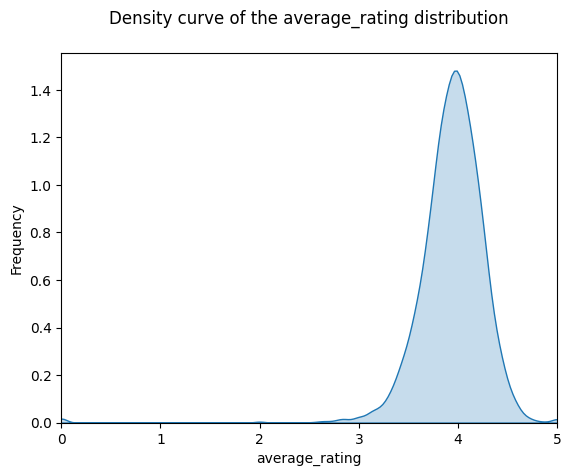

In [397]:
# ratings distribution
sns.kdeplot(df['average_rating'], fill = True)
plt.title('Density curve of the average_rating distribution\n')
plt.xlim((0, 5))
plt.xlabel('average_rating')
plt.ylabel('Frequency')

## ratings_count

In [398]:
#Visualizing the distribution of the series
fig = px.box(df, y='ratings_count', title='Box plot of the ratings_count distribution')
fig.show()

Text(0, 0.5, 'Frequency')

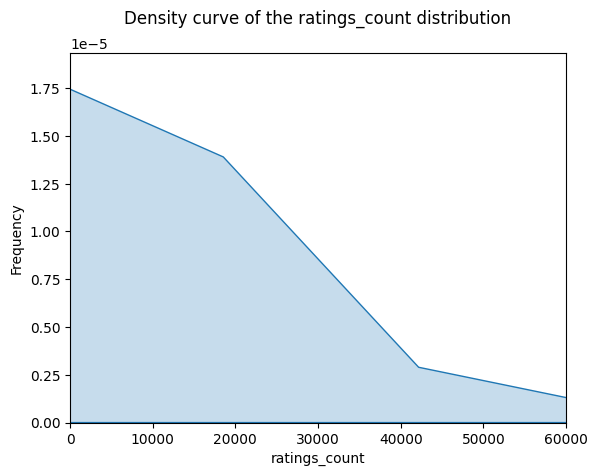

In [399]:
# ratings distribution
sns.kdeplot(df['ratings_count'], fill = True)
plt.title('Density curve of the ratings_count distribution\n')
plt.xlim((0, 60000))
plt.xlabel('ratings_count')
plt.ylabel('Frequency')

In [400]:
fig = px.scatter(df,
    x='ratings_count',
     y='average_rating',
      trendline='ols',
       trendline_color_override='red',
        hover_data="title")
fig.update_layout(title='Scatter plot of ratings_count vs average_rating')
fig.show()

## num_pages

In [401]:
#Visualizing the distribution of the series
fig = px.box(df, y='num_pages', title='Box plot of the num_pages distribution')
fig.show()

Text(0, 0.5, 'Frequency')

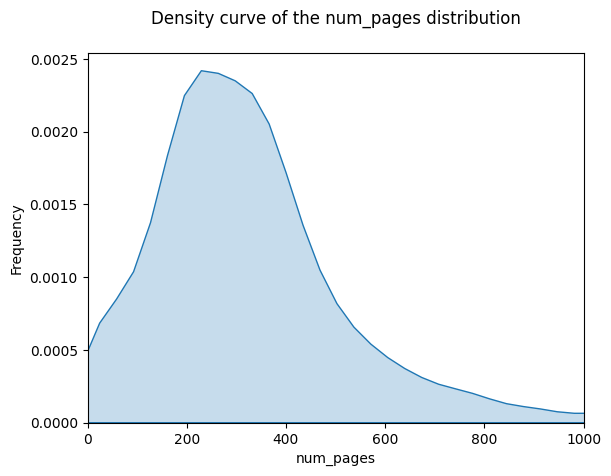

In [402]:
# ratings distribution
sns.kdeplot(df['num_pages'], fill = True)
plt.title('Density curve of the num_pages distribution\n')
plt.xlim((0, 1000))
plt.xlabel('num_pages')
plt.ylabel('Frequency')

In [403]:
fig = px.scatter(df,
    x='num_pages',
     y='average_rating',
      trendline='ols',
       trendline_color_override='red',
        hover_data=["title","ratings_count"])
fig.update_layout(title='Scatter plot of num_pages vs average_rating')
fig.show()

There seems to be an interesting correlation here. We'll remove outliers of the ratings_count variable (1.5 * IQR) to get a clearer observation.

In [404]:
lol = df.loc[(df["ratings_count"]<=12321) & (df["ratings_count"]>=104)]
fig = px.scatter(lol,
    x='num_pages',
     y='average_rating',
      trendline='ols',
       trendline_color_override='red',
        hover_data=["title","ratings_count"])
fig.update_layout(title='Scatter plot of num_pages vs average_rating')
fig.show()

## Text reviews count

In [405]:
#Visualizing the distribution of the series
fig = px.box(df, y='text_reviews_count', title='Box plot of the number of the text_reviews_count distribution')
fig.show()

Text(0, 0.5, 'Frequency')

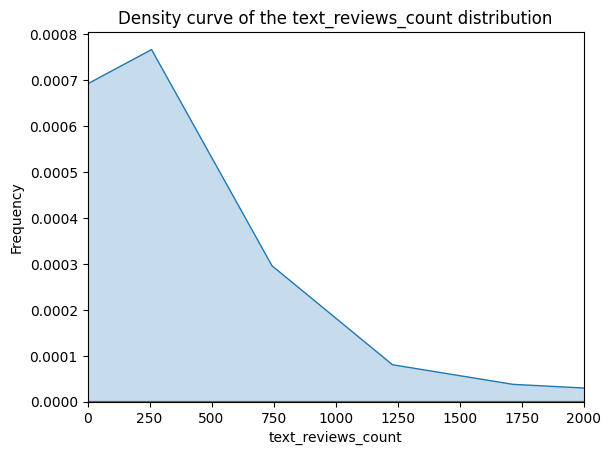

In [406]:
# ratings distribution
sns.kdeplot(df['text_reviews_count'], fill = True)
plt.title('Density curve of the text_reviews_count distribution')
plt.xlim((0, 2000))
plt.xlabel('text_reviews_count')
plt.ylabel('Frequency')

In [407]:
fig = px.scatter(df,
    x='text_reviews_count',
    y='average_rating',
    trendline='ols',
    trendline_color_override='red',
        hover_data=["title","ratings_count"])
fig.update_layout(title='Scatter plot of text_reviews_count vs average_rating')
fig.show()

Let's also investigate the relation between the number of text reviews and the number of ratings a book has received. As we could expect, those two features are highly correlated.

In [408]:
df["ratings_count"].corr(df["text_reviews_count"])

0.8659786568124838

In [409]:
fig = px.scatter(df, x='text_reviews_count', y='ratings_count', trendline='ols', color='average_rating')
fig.update_layout(title='Scatter plot of text_reviews_count vs ratings_count')
fig.show()

## language_code

In [410]:
df["language_code"].value_counts(normalize=False)

language_code
eng      8911
en-US    1409
spa       218
en-GB     214
fre       144
ger        99
jpn        46
mul        19
zho        14
grc        11
por        10
en-CA       7
ita         5
lat         3
enm         3
swe         2
rus         2
ara         1
nl          1
ale         1
srp         1
msa         1
glg         1
wel         1
nor         1
tur         1
gla         1
Name: count, dtype: int64

# Feature engineering

## Year of publication

We extract the year from the date of publication, since it is more convenient for certain tasks.

In [411]:
df["publication_year"] = df["publication_date"].dt.year

## Works

A **Work** is a logical collection of similar editions. "Fantastic Mr. Fox" could be a Work which contains a Spanish translation edition, or perhaps a 2nd edition which has an additional chapter or corrections... 

Works are added to the dataset via the OpenLibrary API. See the corresponding notebook: **get_data_openlibrary.ipynb**

In [5]:
df_works = pd.read_csv(r"data\works.csv",usecols=["isbn","work"],dtype={"isbn":str})

In [413]:
df = df.merge(df_works,on="isbn",how="left")

The work identifier allow us to group different editions of a book, thus deriving new features at the work level.

In [414]:
df.work.duplicated().sum()

1226

❓ Some books do not possess a work identifier. Should we keep them? Maybe the absence of a work identifier is a valuable information for the model.

In [415]:
df.work.isnull().sum()

72

In [416]:
df[df.work.isnull()]

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,publication_year,work
117,21749,Bad Luck and Trouble (Jack Reacher #11),Lee Child,4.18,0739340670,9780739340677,eng,13,53,15,2007-05-15,Random House Audio,2007.0,NaN
124,31318,4:50 from Paddington / A Pocket Full of Rye (BBC Presents: Two Miss Marple Dramas),Agatha Christie,3.94,0553525638,9780553525632,eng,3,34,3,1999-05-04,Random House Audio,1999.0,NaN
412,23589,The J.R.R. Tolkien Companion and Guide,Christina Scull,4.64,0618391134,9780618391134,eng,2264,45,0,2006-11-02,Houghton Mifflin Harcourt,2006.0,NaN
991,96,There's Always Enough: The Miraculous Move of God in Mozambique,Rolland Baker,4.46,1852402873,9781852402877,eng,192,34,6,2003-04-28,Sovereign World,2003.0,NaN
1904,164,The Untouchables,Eliot Ness,3.89,1568491980,9781568491981,eng,256,613,31,1996-02-01,Buccaneer Books,1996.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10997,41824,The Currents of Space (Galactic Empire #2),Isaac Asimov,3.83,4490249512,9780449015414,eng,192,37,3,1952-01-01,Fawcett crest,1952.0,NaN
11013,42425,For Whom the Bell Tolls,Ernest Hemingway,3.97,1117066037,9781117066035,eng,503,365,33,1940-01-01,P. F. Collier and Sons,1940.0,NaN
11123,45617,O Cavalo e o Seu Rapaz (As Crónicas de Nárnia #3),C.S. Lewis,3.92,9722330551,9789722330558,por,160,207,16,2003-08-15,Editorial Presença,2003.0,NaN
11124,45623,O Sobrinho do Mágico (As Crónicas de Nárnia #1),C.S. Lewis,4.04,9722329987,9789722329989,por,147,396,37,2003-04-08,Editorial Presença,2003.0,NaN


## Number of editions by work

We compute the number of different editions by book.

In [417]:
df = (df
        .merge(
            df
            .groupby("work")
            .isbn
            .nunique()
            .rename("editions_by_work"),
            how = "left",
            left_on = "work",
            right_index = True
            )
        )


## work_average_rating

When computing the average rating of a work, we noticed that it is equals to the book average rating for the vast majority of the dataset. 

Here we filter the observations where the work average rating and book average rating differ by more than 0.1.

In [418]:
(df
    .merge(
        df
        .groupby("work")
        .average_rating
        .mean()
        .rename("work_average_rating"),
        how = "left",
        left_on = "work",
        right_index = True
        )
).loc[lambda df: abs(df["average_rating"]-df["work_average_rating"])>0.1][["average_rating","work_average_rating"]]

,average_rating,work_average_rating
83,3.46,3.596667
868,4.53,4.306250
916,4.35,4.480000
1189,3.95,4.150000
1194,3.86,4.058333
...,...,...
10488,4.14,4.306250
10699,4.09,4.210000
10805,4.18,3.865000
10814,4.20,3.960000


Only 99 observations. 

We deduce that the dataset has already integrated the work identifier for the average ratings. Let's see all the editions of Harry Potter #6 for exemple:

In [419]:
df[df.work=="OL82565W"]

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,publication_year,work,editions_by_work
0,1,Harry Potter and the Half-Blood Prince (Harry Potter #6),J.K. Rowling,4.57,0439785960,9780439785969,eng,652,2095690,27591,2006-09-16,Scholastic Inc.,2006.0,OL82565W,4.0
5594,2005,Harry Potter and the Half-Blood Prince (Harry Potter #6),J.K. Rowling,4.57,0747584664,9780747584667,eng,768,1213,78,2006-06-23,Bloomsbury Publishing,2006.0,OL82565W,4.0
7689,5991,混血王子的背叛 (哈利波特 #6),J.K. Rowling,4.57,9573321742,9789573321743,zho,735,75,0,2005-10-01,皇冠文化出版有限公司,2005.0,OL82565W,4.0
9383,15872,Harry Potter y el misterio del príncipe (Harry Potter #6),J.K. Rowling,4.57,8478889930,9788478889938,spa,602,5104,386,2006-02-28,Salamandra,2006.0,OL82565W,4.0


The average rating is the same everywhere! 
We'll not add this feature to the model.

## author_average_rating

In [420]:
df = (df
        .merge(
            df
            .groupby(["authors"])
            ["average_rating"]
            .mean()
            .rename("author_average_rating"),
            how = "left",
            on = "authors"
        )
    )

# publisher_average_rating

In [421]:
df = (df
        .merge(
            df
            .groupby(["publisher"])
            ["average_rating"]
            .mean()
            .rename("publisher_average_rating"),
            how = "left",
            on = "publisher"
        )
    )

## cross_publisher_author_average_rating

So far, we've captured information about the author (`author_average_rating`) and the publisher (`publisher_average_rating`). But what about the interaction of the two? Maybe there are pairs of **authors/publishers** that are very well received by the public due, for exemple, by a great coordination and understanding between the two, or special care on the part of the publisher is brought to the author's work.

Let's try to visualize this by selecting the authors that have been published by more than 20 different publishers. 

Note that the values are sorted **by the number of books published by an editor**, for an author.

In [422]:
df = (df
        .merge(
            df
            .groupby(["authors","publisher"])
            ["average_rating"]
            .mean()
            .rename("cross_publisher_author_average_rating"),
            how = "left",
            on = ["authors","publisher"]
        )
    )

In [423]:
df_plot = (df
    .loc[(df
        .groupby("authors")
        .publisher
        .transform("nunique")
        >20),   
        ["authors","publisher","author_average_rating","cross_publisher_author_average_rating"]
        ]
    .merge(
        df
        .groupby(["authors","publisher"])
        .title
        .count()
        .rename("titles_count"),
        how = "left",
        on = ["authors","publisher"]
    )
    .drop_duplicates(["authors","publisher"])
)

unique_authors = df_plot['authors'].unique()

# Create a function to generate traces for each author
def create_author_trace(author):
    author_df = df_plot[df_plot['authors'] == author].sort_values(by='titles_count', ascending=False)
    trace = go.Bar(x=author_df['publisher'],
                   y=author_df['cross_publisher_author_average_rating'],
                   name='Publisher average rating',
                   visible=False,
                   hovertext= [f"Titles published for this author: {titles_count}" for titles_count in author_df['titles_count']],
                   hoverinfo='text+y')
    return trace

# Create a function to generate the author_average_rating line for each author
def create_author_line(author):
    author_df = df_plot[df_plot['authors'] == author]
    trace = go.Scatter(x=author_df['publisher'],
                       y=author_df['author_average_rating'],
                       mode='lines',
                       name='Author Average Rating',
                       line={'color':'red'},
                       visible=False,
                       hoverinfo="y")
    return trace


# Generate traces for each author
traces = [create_author_trace(author) for author in unique_authors]
lines = [create_author_line(author) for author in unique_authors]

# Set the first author's traces to be visible by default
traces[0]['visible'] = True
lines[0]['visible'] = True

# Create the figure
fig = go.Figure(data=traces + lines)

# Add a dropdown menu to the figure
fig.update_layout(
    updatemenus=[
        go.layout.Updatemenu(
            buttons=list([
                {
                    "args":[{'visible': [author == unique_authors[i] for author in unique_authors] * 2}],
                    "label":author,
                    "method":'update'
                 } for i, author in enumerate(unique_authors)
            ]),
            direction='down',
            pad={'r': 10, 't': 10},
            showactive=True,
            x=0,
            xanchor='left',
            y=2.25,
            yanchor='top'
        ),
    ]
)

# Update layout
fig.update_layout(xaxis_title='Publisher',
                  yaxis_title='Average rating',
                  showlegend=True,
                  legend={
                        'x':0.5,
                        'y':1.75,
                        'xanchor':'left',
                        'yanchor':'top',
                        'orientation':'h'}
                )

# Set the y-axis limits
fig.update_yaxes(range=[3, 5])

fig.show()

❓ Not sure about those explanations.

Some observations are worth mentionning:
- The more works a publisher/author pair has published, the more likely the cross_publisher_author_average_rating seems to be close to the author's average rating. Of course, some divergences are possible (and interesting): Mark Twain / Library of America who scores at 4.28 while the author's average is 3.97.
- The majority of the publishers associated to an author have only published few works (1 or 2). In those cases, either there is nothing to learn for the model (if only one work has been published, the interaction between the author/publisher can't be used elswehere), either the average_rating of the work has probably more to do with the author's itself than the little influence a publisher could have had (2 - 3 works published).

Still, we'll keep this feature and see how the model uses it.

## author_notoriety

We can't measure the level of **experience** of an author, that is, the number of works he has published at a certain date. That's because the same work from an author may have been published mutiple times in different formats (audio book, collection of short stories, revised edition, merged books from a saga...). Yet, if this indicator does not relate to the experience of the author, we may suppose that it correlates to its **notoriety**: the more works he has published the more he is likely to be known.

In [424]:
df = (df
    .merge(
        (df
            .sort_values(['authors', 'publication_date'])
            .set_index("isbn")
            .groupby('authors')
            .cumcount()
            .rename("author_notoriety")
        ),
        left_on = "isbn",
        right_index = True,
        how = "left"
    )
)

Does an author notoriety impacts the ratings of his works? Let's do some visualizations.

In [425]:
fig = px.scatter(df,
    x='author_notoriety',
    y="average_rating",
    trendline='ols',
    trendline_color_override='red')
fig.update_layout(title='Scatter Plot of average_ratings vs author_notoriety')
fig.show()

Let's observe how the **moving average rating** (window=5 observations) of an author's rating evolves as his notoriety increases. We limit our analysis to the authors that have been published more than 20 times.

In [426]:
df_notoriety = df[(df
.groupby("authors")
.author_notoriety
.transform("max")
)>20]

In [427]:
df_notoriety = df_notoriety.sort_values(["authors","publication_date"])
df_notoriety['moving_average_rating'] = df_notoriety.groupby('authors')['average_rating'].transform(lambda x: x.rolling(5, min_periods=1).mean())

In [428]:
fig = px.line(df_notoriety, x="author_notoriety", y="moving_average_rating", color="authors", hover_data=["title","publication_year"])
fig.update_layout(title='Line plot of author_notoriety vs moving_average_rating(5)')
fig.show()

It is hard to draw any decisive conclusion from this chart.

## is_series

We noticed that it is possible to extract the series a book belongs to from its title, with this format: `Title (Series #Series number)`.

In [429]:
(df
    .loc[:,"title"]
    .str.extract(r'(\(.*#.*\))', expand=False)
    .str.extract(r'\(([^#]+?)\s*#.*\)', expand=False)
    .value_counts()
)

title
Hercule Poirot                 21
Discworld                      21
Harry Potter                   19
Anita Blake  Vampire Hunter    17
Xanth                          16
                               ..
Freak The Mighty                1
Prairie River                   1
Animal Ark                      1
Pyrates                         1
Follow Your Heart               1
Name: count, Length: 1118, dtype: int64

Some series appear to have only one title. We suppose that it is because not all the books of a series exist in the dataset. Sometimes though, the series does not appear in the title (for exemple, "**The Van**" from Roddy Doyle, which is a part of the Barrytown series).

In [430]:
df[df.authors=="Roddy Doyle"]

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,publication_year,work,editions_by_work,author_average_rating,publisher_average_rating,cross_publisher_author_average_rating,author_notoriety
934,42718,A Star Called Henry,Roddy Doyle,3.84,0099284480,9780099284482,eng,342,6885,438,2000-09-07,Vintage,2000.0,OL762609W,1.0,3.828182,3.894182,3.620,3
935,42741,Yeats Is Dead,Roddy Doyle,3.40,0099422344,9780099422341,eng,298,34,4,2002-06-06,Vintage,2002.0,OL9203940W,1.0,3.828182,3.894182,3.620,5
1676,42698,Oh Play That Thing,Roddy Doyle,3.29,014303605X,9780143036050,en-US,384,1545,105,2005-10-25,Penguin Books,2005.0,OL19283W,1.0,3.828182,3.912847,3.615,9
1677,42701,The Van (The Barrytown Trilogy #3),Roddy Doyle,3.94,0140260021,9780140260021,eng,320,5718,164,1997-03-01,Penguin Books,1997.0,OL762614W,3.0,3.828182,3.912847,3.615,1
5630,30510,Paula Spencer,Roddy Doyle,3.78,0670038164,9780670038169,en-US,281,1956,186,2007-01-01,Viking Books,2007.0,OL19287W,1.0,3.828182,3.772308,3.780,10
7090,42714,The Giggler Treatment,Roddy Doyle,4.17,0439993857,9780439993852,en-GB,112,1425,149,2001-07-20,Scholastic Inc.,2001.0,OL762607W,1.0,3.828182,3.995714,4.170,4
8836,30512,Paddy Clarke Ha Ha Ha,Roddy Doyle,3.76,2264022442,9782264022448,eng,307,17042,586,1998-06-04,Editions 10/18,1998.0,OL762615W,1.0,3.828182,3.903333,3.760,2
11027,42706,Fish & Chips (The Barrytown Trilogie #3),Roddy Doyle,3.94,3596153026,9783596153022,ger,314,2,0,2002-10-01,Fischer Taschenbuch Verlag,2002.0,OL762614W,3.0,3.828182,3.940000,3.940,8
11028,42719,The Van,Roddy Doyle,3.94,043620052X,9780436200526,eng,312,30,4,1991-08-04,Secker and Warburg,1991.0,OL762614W,3.0,3.828182,3.940000,3.940,0
11029,42728,Rover rettet Weihnachten.,Roddy Doyle,4.12,3570127214,9783570127216,ger,160,1,0,2002-09-01,Omnibus Hc Bei Bertelsmann,2002.0,OL762587W,1.0,3.828182,4.120000,4.120,6


We'll let our model know if a book belongs to a series or not.

In [431]:
df["is_series"] = df['title'].str.contains(r'(\(.*#.*\))',regex=True).astype(int)

## engagement

We try to calculate an "engagement" score, that is, the number of text reviews divided by the number of ratings.

In [432]:
df["engagement"] = (df["text_reviews_count"]/df["ratings_count"]).replace([np.inf, -np.inf], 0)

In [433]:
fig = px.box(df, y='engagement', title='Box plot of the engagement distribution')
fig.show()

Let's visualize the relation betwen engagement, average_ratings and ratings_count (on which we used log).

In [434]:
df_plot = (
    df.assign(
        engagement = df.engagement,
        average_rating = df.average_rating,
        log_ratings_count = np.log(df.ratings_count)
    )
)

fig = px.scatter(df_plot,
    x='engagement',
    y="average_rating",
    color="log_ratings_count")
fig.update_layout(title='Scatter Plot of average_ratings vs engagement')
fig.show()

One thing we can learn from this plot is that the more the engagement score, the fewer the ratings count, that is, the book is not popular. Conversely, the more popular is a book, the fewer the engagement.

## tags

Retrieving the work identifier also allowed us to fetch the tags associated to a work via the OpenLibrary API. See the get_data_openlibrary notebook.

The tags associated to a work are of four types: themes, people, places, times. The full procedure of retrieving and proceding the tags is complex and can be found in the process_tags notebook. We'll give a brief explanation here.

- There can be numerous tags associated with a single work, which posed some computational problems. We ignored tags that where not present in other works since we're interested in studying the similarity of works through their tags. 
- Once all the tags were fetched for each work, we first used one hot encoding then the tf-idf procedure to better capture the relevance of the tags for a work.
- We then used a dimensionnality reduction algortihm: UMAP. We ended up with 8 features, 2 for each type.

We can now visualize the proximity of works through their associated tags

In [435]:
df = df.merge(
    pd.read_csv(r"data\tags_reduced.csv"),
    on = "work",
    how = "left"
)

Let's visualize some works by great thinkers and philosophers, by their **themes** tags.

In [436]:
df_plot = df[df["authors"].str.contains("Schopenhauer|Hegel|Kant|Goethe|Nietzsche|Descartes",regex=True,case=False)==True]

In [437]:
fig = px.scatter(df_plot,
    x='subjects_d1',
    y="subjects_d2",
    color="title",
    hover_data="authors")
fig.update_layout(title='Scatter Plot of average_ratings vs engagement',showlegend=False)
fig.show()

Let's visualize some science-fiction classics by their **themes** tags.

In [438]:
df_plot = df[df["title"].str.contains("dune|hyperion|foundation",regex=True,case=False)==True]

In [439]:
fig = px.scatter(df_plot,
    x='subjects_d1',
    y="subjects_d2",
    color="title",
    hover_data="authors")
fig.update_layout(title='Scatter Plot of average_ratings vs engagement',showlegend=False)
fig.show()

Let's visualize some fantasy classics by their **people** tags. (Use the zoom, as some works are really close to each other)

In [440]:
df_plot = df[df["title"].str.contains("lord of the rings|hobbit|harry potter|narnia",regex=True,case=False)==True]

In [441]:
fig = px.scatter(df_plot,
    x='people_d1',
    y="people_d2",
    color="title",
    hover_data="authors")
fig.update_layout(title='Scatter Plot of average_ratings vs engagement',showlegend=False)
fig.show()

Let's visualize all the books that contain "sherlock" in their title, by their **people** tags. (Use the zoom, as some works are really close to each other)

In [442]:
df_plot = df[df["title"].str.contains("sherlock",regex=True,case=False)==True]

In [443]:
fig = px.scatter(df_plot,
    x='people_d1',
    y="people_d2",
    color="title",
    hover_data="authors")
fig.update_layout(title='Scatter Plot of average_ratings vs engagement',showlegend=False)
fig.show()

Finally, let's observe the **place tags** of all the works by Stephen King, who often sets his plots in Maine.

In [444]:
df_plot = df.loc[df["authors"].str.contains("stephen king",regex=True,case=False)==True]

In [445]:
fig = px.scatter(df_plot
    ,
    x='places_d1',
    y="places_d2",
    color="title",
    hover_data="authors")
fig.update_layout(title='Scatter Plot of average_ratings vs engagement',showlegend=False)
fig.show()

## language_code

✅ to-do

# Preprocessing

In [446]:
df_preprocessed = (df
.drop(["bookID","title","authors","isbn","isbn13",
"language_code","publication_date","publisher",
"work"],
axis=1)
.fillna(0)
)

## Label encoding

❓ Through my research, features with high cardinality shouldn't be label encoded as it can gives some sort of inexistant hierachichal order between the labels. I think that all the information about the authors and publishers have already been captured by the data through many features  (author_average_rating, publisher_average_rating, cross_author_publisher_average_rating) and do not need label encoding.

## Outliers

❓Some models like random forest seem very resistant to outliers, and removing them is sometimes a bad idea.

# Models

✅ To remove, just for testing models. Training will be done on another notebook.

##  Random forest

In [447]:
y = df_preprocessed.pop('average_rating')

X_train, X_test, y_train, y_test = train_test_split(df_preprocessed, y, test_size=0.3, random_state=42)

In [448]:
global_result = pd.DataFrame(columns=['model name','RMSE','mae','r2_score'])

In [449]:
parameters = {
    'n_estimators': [50, 100, 200],
    'max_depth': [7, 10, 12, 15],
    'min_samples_split': [2,5],
    'min_samples_leaf': [5, 10, 15]
}
regr = RandomForestRegressor(random_state=0)

In [450]:
clf = GridSearchCV(estimator = regr, param_grid = parameters,cv=3,verbose=2, n_jobs = -1)

In [451]:
clf.fit(X_train,y_train)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


GridSearchCV(cv=3, estimator=RandomForestRegressor(random_state=0), n_jobs=-1,
             param_grid={'max_depth': [7, 10, 12, 15],
                         'min_samples_leaf': [5, 10, 15],
                         'min_samples_split': [2, 5],
                         'n_estimators': [50, 100, 200]},
             verbose=2)

In [452]:
clf.best_params_

{'max_depth': 7,
 'min_samples_leaf': 5,
 'min_samples_split': 2,
 'n_estimators': 100}

In [453]:
best_rf = clf.best_estimator_
y_pred = clf.predict(X_test)

In [454]:
importance_feature = pd.DataFrame(best_rf.feature_importances_,index=X_train.columns,columns=['Importance']).sort_values(by=['Importance'],ascending=False)
importance_feature.sort_values(by=['Importance'],ascending=True,inplace=True)
importance_feature

,Importance
is_series,0.000040
editions_by_work,0.000094
times_d1,0.000178
people_d2,0.000237
places_d1,0.000248
people_d1,0.000259
places_d2,0.000313
times_d2,0.000400
subjects_d1,0.000531
text_reviews_count,0.000556


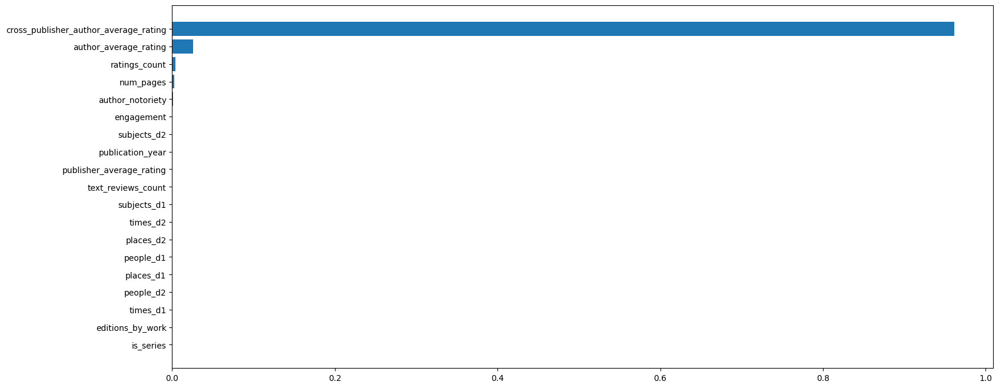

In [455]:
plt.figure(figsize=(18,8))
plt.barh(y=importance_feature.index,width=importance_feature.values.reshape((-1,)))
plt.show()

In [456]:
### Metrics
# calculate errors
errors = mean_squared_error(y_test,y_pred)
rmse = math.sqrt(errors)
print(f'RMSE : {rmse}')
mae = mean_absolute_error(y_test,y_pred)
print(f'mae : {mae}')
r2 = r2_score(y_test,y_pred).round(2)
print(f'r2_score : {r2.round(2)}')

# Create dictionnary to aggregte all result 
dict = {'model name' : 'Random Forest','RMSE':rmse,'mae':mae,'r2_score':r2 }
global_result.loc[len(global_result)] = pd.Series(data=dict,index=dict.keys())


RMSE : 0.10777129637469574
mae : 0.049383725731331346
r2_score : 0.92


In [457]:
pred = pd.DataFrame({'Actual': y_test.tolist(), 'Predicted': y_pred.tolist()}).head(25)
pred.head(5)

,Actual,Predicted
0,3.67,3.672780
1,4.17,4.173938
2,3.63,3.589395
3,3.89,3.867099
4,3.70,3.673542


## XGBoost

In [458]:
xgb = XGBRegressor()

In [459]:
parameters = {'nthread':[6],
              'objective':['reg:linear'],
              'learning_rate': [0.01,.03], #so called `eta` value
              'max_depth': [5,7,15],
              'subsample': [0.5],
              'n_estimators': [500,1000]}

In [460]:
xgb_grid = GridSearchCV(xgb,
                        parameters,
                        cv = 2,
                        n_jobs = 5,
                        verbose=True)

In [461]:
xgb_grid.fit(X_train,y_train)

Fitting 2 folds for each of 12 candidates, totalling 24 fits


[00:42:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.


GridSearchCV(cv=2,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None, gpu_id=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                                    n_jobs=None, num_parallel_tree=None,
                                    predictor=None, random_state=None, ...),
             n_jobs=5,
             param_grid={'learning_rate': [0.01, 0.03], 'max_depth': [5, 7, 15],
                         'n_estimators': [500, 1000], 'nthread': [6],
                         'objective': ['reg:linear'], 'subsample': [0.5]},
             verbose=True)

In [462]:
print(xgb_grid.best_score_)
print(xgb_grid.best_params_)

0.9026638217228274
{'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 1000, 'nthread': 6, 'objective': 'reg:linear', 'subsample': 0.5}


In [463]:
optimal_xgb = xgb_grid.best_estimator_

In [464]:
y_pred = optimal_xgb.predict(X_test)

In [465]:
### Metrics
# calculate errors
errors = mean_squared_error(y_test,y_pred)
rmse = math.sqrt(errors)
print(f'RMSE : {rmse}')
mae = mean_absolute_error(y_test,y_pred)
print(f'mae : {mae}')
r2 = r2_score(y_test,y_pred).round(2)
print(f'r2_score : {r2.round(2)}')

# Create dictionnary to aggregte all result 
dict = {'model name' : 'XGBoost','RMSE':rmse,'mae':mae,'r2_score':r2 }
global_result.loc[len(global_result)] = pd.Series(data=dict,index=dict.keys())

pred = pd.DataFrame({'Actual': y_test.tolist(), 'Predicted': y_pred.tolist()}).head(25)

RMSE : 0.10696447144953608
mae : 0.051188935014865114
r2_score : 0.92
